In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import os
from PIL import Image
from keras.preprocessing import image
from keras.callbacks import EarlyStopping

Using TensorFlow backend.


In [2]:
# files in the folder 
for files in os.listdir("foodinput"):
    print(files)

churros
waffles
apple_pie


In [3]:

apple = r'foodinput/apple_pie/'
waffles = r'foodinput/waffles/'
churros = r'foodinput/churros/'
# getting all the file names in the folder
train_apple = os.listdir(apple)
train_waffle = os.listdir(waffles)
train_churro = os.listdir(churros)


In [4]:
# removing check points 
if ".ipynb_checkpoints" in train_apple:
    train_apple.remove(".ipynb_checkpoints")

In [5]:
# spliting the data for training and testing

cut = int(len(train_apple)*.80)
training_apple = train_apple[:cut]
testing_apple  = train_apple[cut:]

cut = int(len(train_waffle)*.80)
training_waffle= train_waffle[:cut]
testing_waffle = train_waffle[cut:]

cut = int(len(train_churro)*.80)
training_churro= train_churro[:cut]
testing_churro = train_churro[cut:]


In [6]:
# Display 
print("training apple pi ", len(training_apple))
print("training waffle ", len(training_waffle))
print("training churro", len(training_churro))

print("\ntesting apple ", len(testing_apple))
print("testing waffle ", len(testing_waffle))
print("testing churro ", len(testing_churro))


training apple pi  800
training waffle  800
training churro 800

testing apple  200
testing waffle  200
testing churro  200


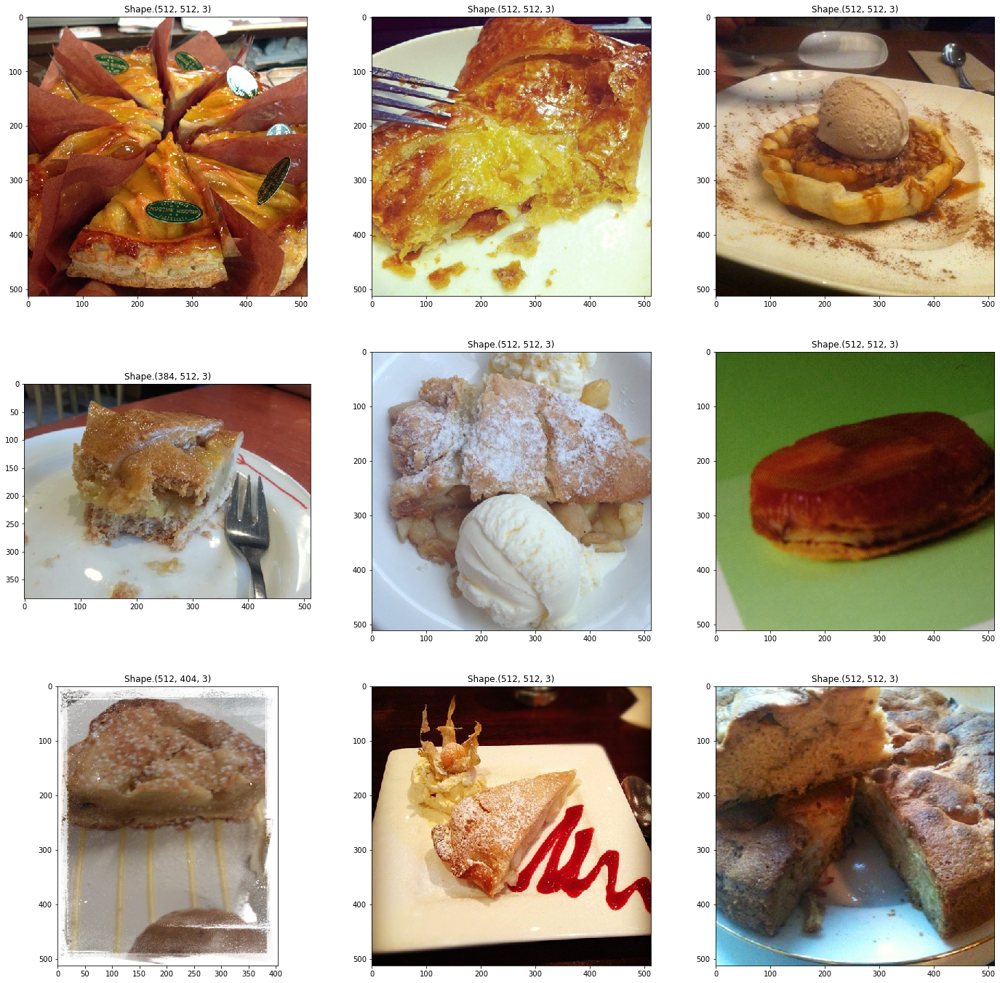

In [7]:
# Displaying pictures 
apple_fig, apple_axes = plt.subplots(3,3)
apple_fig.set_figheight(24)
apple_fig.set_figwidth(24)

for i, axis in enumerate(apple_axes):
    for j, f in enumerate(axis):
        img = plt.imread(apple+training_apple[i*3+j])
        apple_axes[i,j].imshow(img)
        apple_axes[i,j].set_title("Shape.{}".format(img.shape))

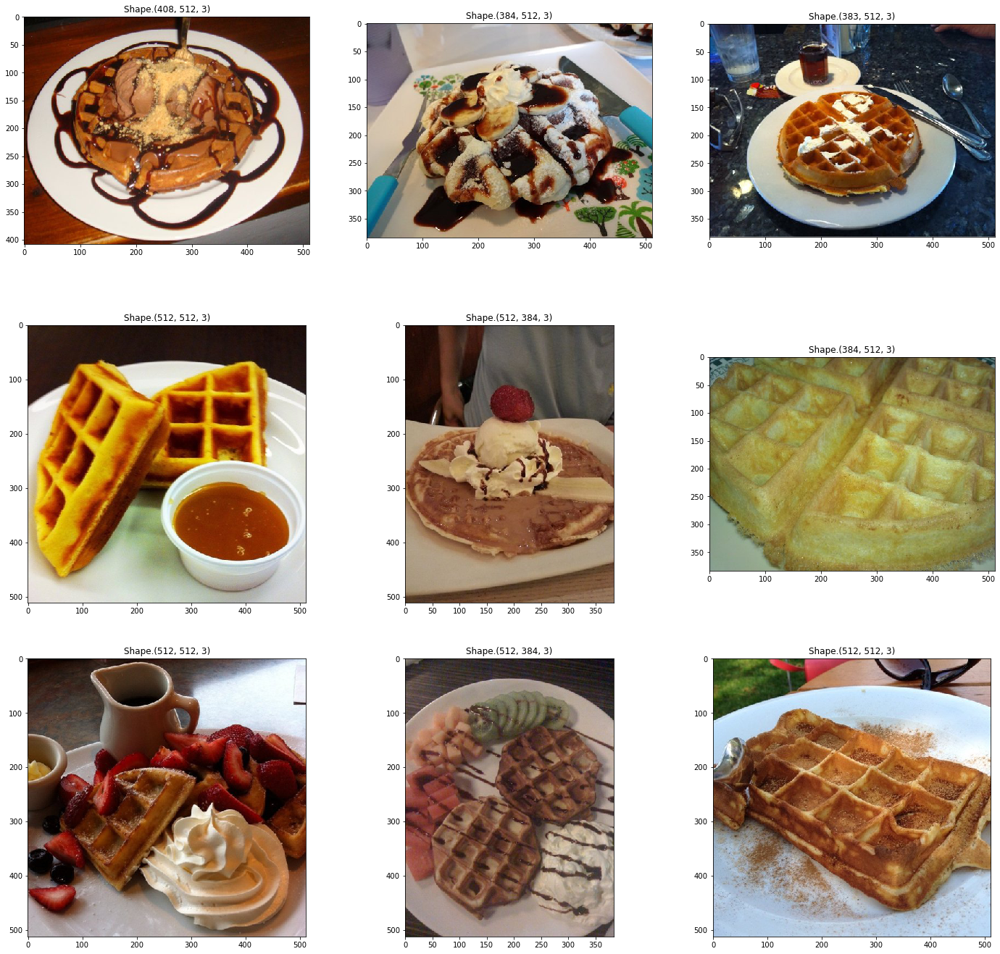

In [8]:
# Displaying pictures 

waffle_fig, waffle_axes = plt.subplots(3,3)
waffle_fig.set_figheight(24)
waffle_fig.set_figwidth(24)

for i, axis in enumerate(waffle_axes):
    for j, f in enumerate(axis):
        img = plt.imread(waffles+training_waffle[i*3+j])
        waffle_axes[i,j].imshow(img)
        waffle_axes[i,j].set_title("Shape.{}".format(img.shape))

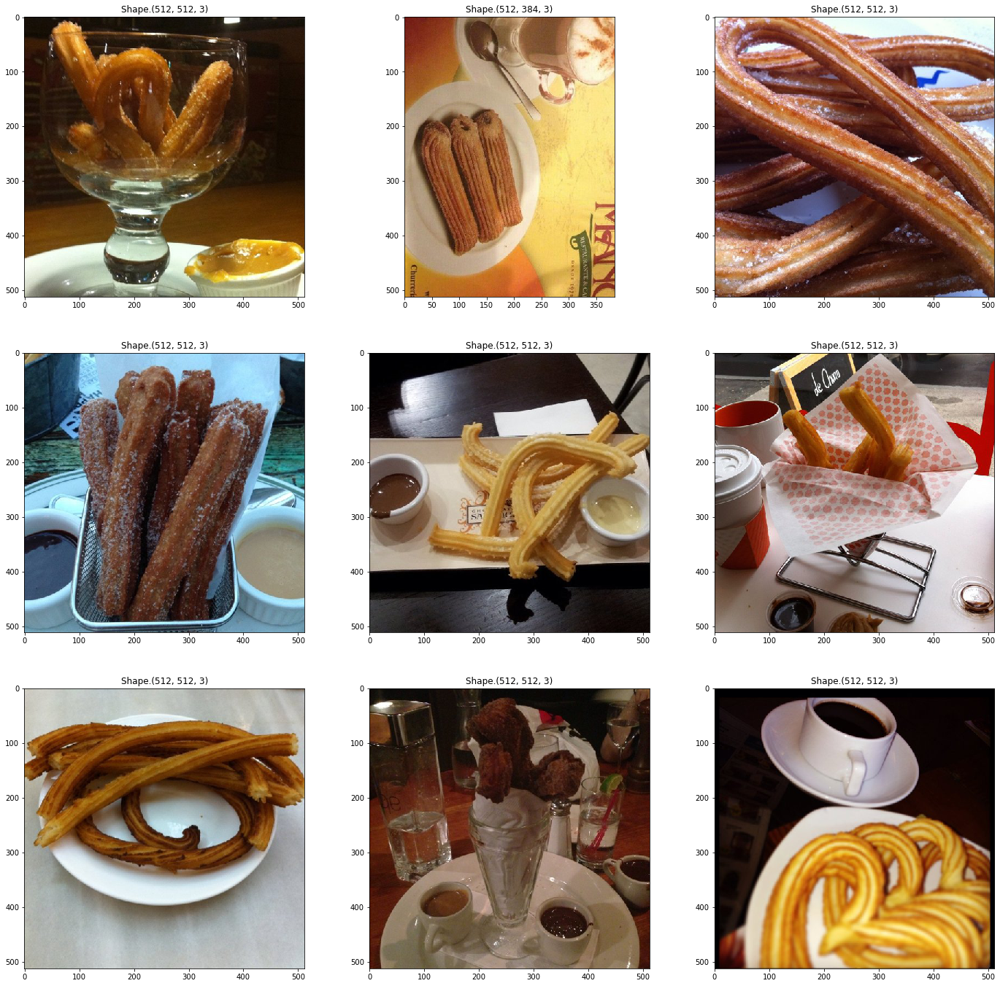

In [9]:
# Displaying pictures 

churro_fig, churro_axes = plt.subplots(3,3)
churro_fig.set_figheight(24)
churro_fig.set_figwidth(24)

for i, axis in enumerate(churro_axes):
    for j, f in enumerate(axis):
        img = plt.imread(churros+training_churro[i*3+j])
        churro_axes[i,j].imshow(img)
        churro_axes[i,j].set_title("Shape.{}".format(img.shape))

In [10]:
# very important 
input_shape = (224,224,3)
# number of classes 
num_classes = 3

In [11]:
from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, Flatten, Activation
from keras.optimizers import SGD
from keras.utils import np_utils
from keras.models import load_model
from keras.applications.mobilenet import MobileNet

In [12]:
# MobileNet model, with weights pre-trained on ImageNet.
mobilenet = MobileNet(input_shape, weights='imagenet', include_top=False)

In [13]:
model = Sequential()
model.add(mobilenet)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))
model.summary()
sgd = SGD(lr=0.0001, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(loss='binary_crossentropy', optimizer=sgd, metrics=['accuracy'])

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenet_1.00_224 (Model)   (None, 7, 7, 1024)        3228864   
_________________________________________________________________
flatten_1 (Flatten)          (None, 50176)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               12845312  
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 771       
Total params: 16,074,947
Trainable params: 16,053,059
Non-trainable params: 21,888
_________________________________________________________________


Now we need to prepare the training and testing dataset, we assign dogs to class 0 and cats to class 1.

In [14]:
# resize from images 
img_resize = (224,224)

apple_train = []
waffle_train = []
churro_train = []

apple_test = []
waffle_test = []
churro_test = []

# load images for testing and training 
for apple_pie in training_apple:
    img = Image.open(apple + apple_pie)
    img = img.resize(img_resize)
    img = np.asarray(img)
    apple_train.append(img)
    
for waffle in training_waffle:
    img = Image.open(waffles + waffle)
    img = img.resize(img_resize)
    img = np.asarray(img)
    waffle_train.append(img)
    
for churro_r in training_churro:
    img = Image.open(churros+ churro_r)
    img = img.resize(img_resize)
    img = np.asarray(img)
    churro_train.append(img)

    
for apple_pie in testing_apple:
    img = Image.open(apple + apple_pie)
    img = img.resize(img_resize)
    img = np.asarray(img)
    apple_test.append(img)
    
for waffle in testing_waffle:
    img = Image.open(waffles + waffle)
    img = img.resize(img_resize)
    img = np.asarray(img)
    waffle_test.append(img)
    
for churro_t in testing_churro:
    img = Image.open(churros + churro_t)
    img = img.resize(img_resize)
    img = np.asarray(img)
    churro_test.append(img)


In [15]:
# image resize  
#plt.imshow(plt.imread(churros+churros_train[1]))

In [16]:
# adding label to the traing 
apple_train_label = [0 for _ in range(len(apple_train))]
waffle_train_label = [1 for _ in range(len(waffle_train))]
churro_train_label = [2 for _ in range(len(waffle_train))]

apple_test_label = [0 for _ in range(len(waffle_test))]
waffle_test_label = [1 for _ in range(len(waffle_test))]
churro_test_label = [2 for _ in range(len(waffle_test))]

In [17]:
apple_train_label.extend(waffle_train_label)
apple_train_label.extend(churro_train_label)

apple_test_label.extend(waffle_test_label)
apple_test_label.extend(churro_test_label)

label_train = np_utils.to_categorical(apple_train_label, num_classes)
label_test = np_utils.to_categorical(apple_test_label, num_classes)

In [18]:

#for train data
apple_train.extend(waffle_train)
apple_train.extend(churro_train)

# normailize data
data_train = np.array(apple_train, dtype=np.float32)
data_train /= 255

# shuffle data
index = np.arange(len(data_train))
np.random.shuffle(index)

data_train = data_train[index]
label_train = label_train[index]

#for test data
apple_test.extend(waffle_test)
apple_test.extend(churro_test)

# normailize data
data_test = np.array(apple_test, dtype=np.float32)
data_test /= 255
data_train /= 255

# shuffle data
index = np.arange(len(data_test))
np.random.shuffle(index)

data_test = data_test[index]
label_test = label_test[index]


In [19]:
# Remove single-dimensional entries from the shape of an array.
data_train = np.squeeze(data_train)
data_test = np.squeeze(data_test)
label_train = np.squeeze(label_train)
label_test = np.squeeze(label_test)
print("Training label shape: ", label_train.shape)
print("Testing label shape: ", label_test.shape)
print("Training data shape: ", data_train.shape)
print("Testing data shape: ", data_test.shape)

Training label shape:  (2400, 3)
Testing label shape:  (600, 3)
Training data shape:  (2400, 224, 224, 3)
Testing data shape:  (600, 224, 224, 3)


In [20]:
# early stop
early_stopping_monitor = EarlyStopping(patience=3)


#history = model.fit(data_train, label_train, 
#                    validation_split=0.2, 
#                    batch_size=4, epochs=10, 
#                    callbacks=[early_stopping_monitor])

Now start traning

In [21]:
# train model
history = model.fit(data_train, label_train, validation_split=0.2, batch_size=4, epochs=10)

Train on 1920 samples, validate on 480 samples
Epoch 1/10
1920/1920 [==============================] - 271s 141ms/step - loss: 0.7090 - accuracy: 0.7286 - val_loss: 0.5141 - val_accuracy: 0.7674
Epoch 2/10
1920/1920 [==============================] - 259s 135ms/step - loss: 0.3634 - accuracy: 0.8438 - val_loss: 0.3038 - val_accuracy: 0.8681
Epoch 3/10
1920/1920 [==============================] - 255s 133ms/step - loss: 0.3006 - accuracy: 0.8736 - val_loss: 0.2552 - val_accuracy: 0.8875
Epoch 4/10
1920/1920 [==============================] - 255s 133ms/step - loss: 0.2693 - accuracy: 0.8844 - val_loss: 0.3117 - val_accuracy: 0.8715
Epoch 5/10
1920/1920 [==============================] - 254s 132ms/step - loss: 0.2214 - accuracy: 0.9092 - val_loss: 0.2632 - val_accuracy: 0.8972
Epoch 6/10
1920/1920 [==============================] - 255s 133ms/step - loss: 0.1760 - accuracy: 0.9280 - val_loss: 0.2759 - val_accuracy: 0.8917
Epoch 7/10
1920/1920 [==============================] - 252s 131m

In [22]:
# save model
model.save("food_model3.h5")

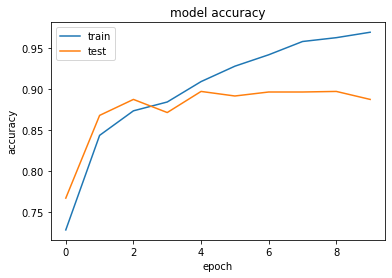

In [23]:
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


Now we would like to see the performance of the model during training

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


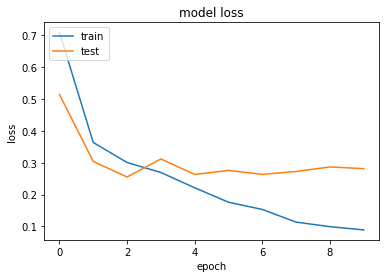

In [24]:
print(history.history.keys())


# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [25]:
test_result = model.predict(data_test, batch_size=4)

In [26]:
test_result[1]

array([0.02130435, 0.06210514, 0.9165905 ], dtype=float32)

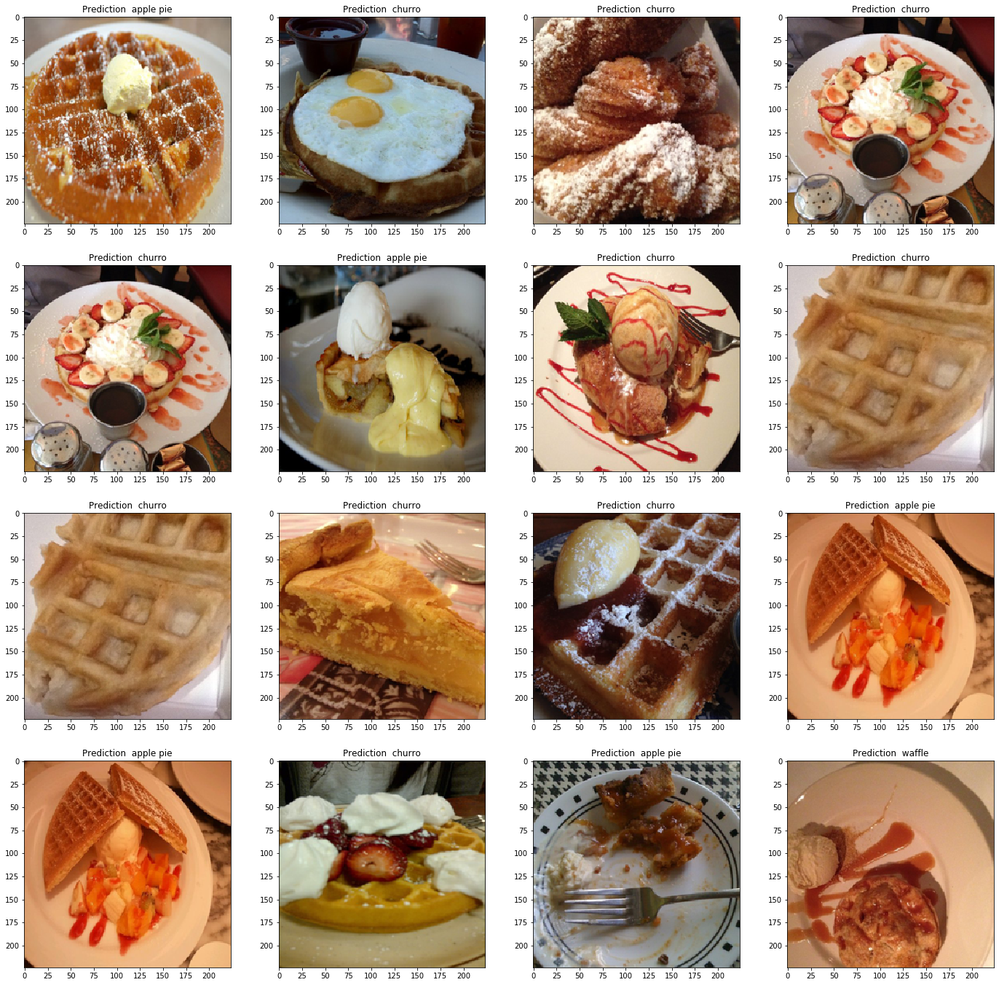

In [27]:
_fig, _axes = plt.subplots(4,4)

_fig.set_figheight(24)
_fig.set_figwidth(24)


for i in range(4):
    for j in range(4):
        img = data_test[i*3+j]
        _axes[i,j].imshow(img)
        if np.argmax(test_result[i*3+j]) == 0:
            _axes[i,j].set_title("Prediction  {}".format('apple pie'))
        elif np.argmax(test_result[i*3+j]) == 1:
            _axes[i,j].set_title("Prediction  {}".format('waffle'))
        elif np.argmax(test_result[i*3+j]) == 2:
            _axes[i,j].set_title("Prediction  {}".format('churro')) 

Now let's plot some of the wrong classifications